A test and the data Augmentator

In [1]:
import pickle
import os, cv2
from preprocessing import parse_annotation, BatchGenerator
from utils import WeightReader, decode_netout, draw_boxes
import matplotlib.pyplot as plt

%matplotlib inline

Using TensorFlow backend.


In [2]:
from imgaug import augmenters as iaa

In [3]:
# just load the images and annotations

doPickle=False;

if(doPickle==True):
    train_imgs, seen_train_labels = parse_annotation(train_annot_folder, train_image_folder, labels=LABELS)
    ### write parsed annotations to pickle for fast retrieval next time
    with open('train_imgs', 'wb') as fp:
        pickle.dump(train_imgs, fp)
else:
    ### read saved pickle of parsed annotations
    with open ('train_imgs', 'rb') as fp:
        train_imgs = pickle.load(fp)
        

if(doPickle==True):
    valid_imgs, seen_valid_labels = parse_annotation(valid_annot_folder, valid_image_folder, labels=LABELS)
    ### write parsed annotations to pickle for fast retrieval next time
    with open('valid_imgs', 'wb') as fp:
        pickle.dump(valid_imgs, fp)
else:
    ### read saved pickle of parsed annotations
    with open ('valid_imgs', 'rb') as fp:
        valid_imgs = pickle.load(fp)

In [4]:
'''
len(train_imgs)
numTest=5;
for ii in range(numTest):
    im=cv2.imread(train_imgs[ii]['filename'])
    plt.figure(figsize=(5,5))
    plt.imshow(im[:,:,::-1])
'''

"\nlen(train_imgs)\nnumTest=5;\nfor ii in range(numTest):\n    im=cv2.imread(train_imgs[ii]['filename'])\n    plt.figure(figsize=(5,5))\n    plt.imshow(im[:,:,::-1])\n"

In [7]:
### augmentors by https://github.com/aleju/imgaug
sometimes = lambda aug: iaa.Sometimes(0.99, aug)

# Define our sequence of augmentation steps that will be applied to every image
# All augmenters with per_channel=0.5 will sample one value _per image_
# in 50% of all cases. In all other cases they will sample new values
# _per channel_.
aug_pipe = iaa.Sequential(
    [
        # apply the following augmenters to most images
        #iaa.Fliplr(0.5), # horizontally flip 50% of all images
        #iaa.Flipud(0.2), # vertically flip 20% of all images
        #sometimes(iaa.Crop(percent=(0, 0.1))), # crop images by 0-10% of their height/width
        sometimes(iaa.Affine(
            #scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
            #translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
            #rotate=(-5, 5), # rotate by -45 to +45 degrees
            #shear=(-5, 5), # shear by -16 to +16 degrees
            #order=[0, 1], # use nearest neighbour or bilinear interpolation (fast)
            #cval=(0, 255), # if mode is constant, use a cval between 0 and 255
            #mode=ia.ALL # use any of scikit-image's warping modes (see 2nd image from the top for examples)
        )),
        # execute 0 to 5 of the following (less important) augmenters per image
        # don't execute all of them, as that would often be way too strong
        iaa.SomeOf((0, 5),
            [
                #sometimes(iaa.Superpixels(p_replace=(0, 1.0), n_segments=(20, 200))), # convert images into their superpixel representation
                iaa.OneOf([
                    iaa.GaussianBlur((0, 1.5)), # blur images with a sigma between 0 and 3.0
                    iaa.AverageBlur(k=(2, 3)), # blur image using local means with kernel sizes between 2 and 7
                    iaa.MedianBlur(k=(3, 7)), # blur image using local medians with kernel sizes between 2 and 7
                ]),
                #iaa.Sharpen(alpha=(0, 1.0), lightness=(0.75, 1.5)), # sharpen images
                #iaa.Emboss(alpha=(0, 1.0), strength=(0, 2.0)), # emboss images
                # search either for all edges or for directed edges
                #sometimes(iaa.OneOf([
                #    iaa.EdgeDetect(alpha=(0, 0.7)),
                #    iaa.DirectedEdgeDetect(alpha=(0, 0.7), direction=(0.0, 1.0)),
                #])),
                #iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5), # add gaussian noise to images
                iaa.AdditiveGaussianNoise(scale=0.07*255), # add gaussian noise to images
                #iaa.OneOf([
                #    iaa.Dropout((0.01, 0.1), per_channel=0.5), # randomly remove up to 10% of the pixels
                #    #iaa.CoarseDropout((0.03, 0.15), size_percent=(0.02, 0.05), per_channel=0.2),
                #]),
                #iaa.Invert(0.05, per_channel=True), # invert color channels
                #iaa.Add((-10, 10), per_channel=0.5), # change brightness of images (by -10 to 10 of original value)
                #iaa.Multiply((0.5, 1.2), per_channel=0.5), # change brightness of images (50-150% of original value)
                #iaa.ContrastNormalization((0.5, 2.0), per_channel=0.5), # improve or worsen the contrast
                iaa.OneOf([
                    iaa.Add((-10, 10)), # change brightness of images (by -10 to 10 of original value)
                    iaa.Multiply((0.5, 1.2)), # change brightness of images (50-150% of original value)
                    iaa.ContrastNormalization((0.5, 2.0)), # improve or worsen the contrast
                ]),
                
                
                #iaa.Grayscale(alpha=(0.0, 1.0)),
                #sometimes(iaa.ElasticTransformation(alpha=(0.5, 3.5), sigma=0.25)), # move pixels locally around (with random strengths)
                #sometimes(iaa.PiecewiseAffine(scale=(0.01, 0.05))) # sometimes move parts of the image around
            ],
            random_order=True
        )
    ],
    random_order=True
)

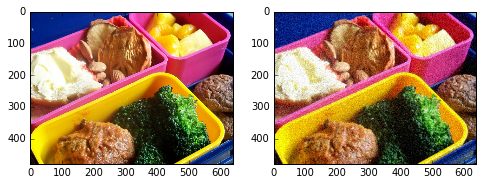

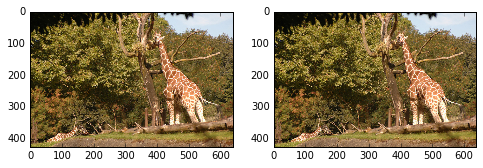

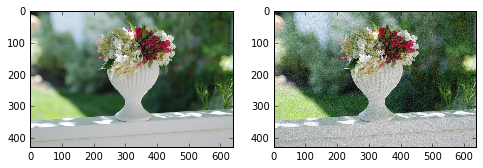

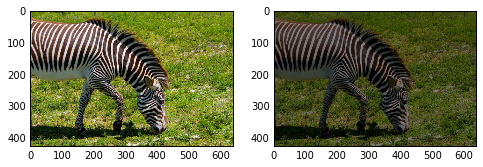

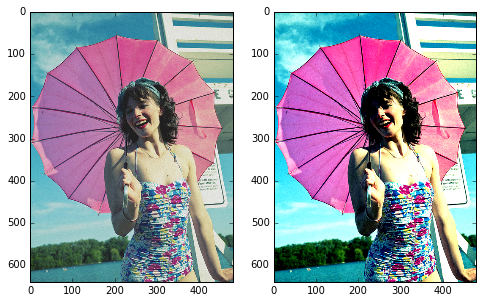

...

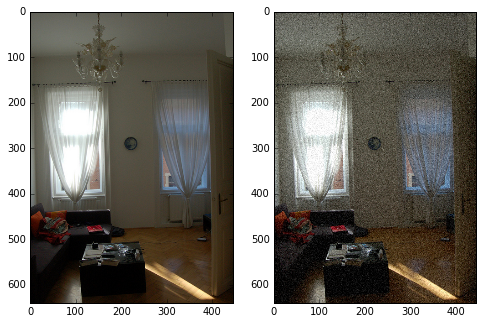

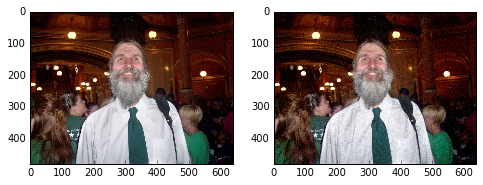

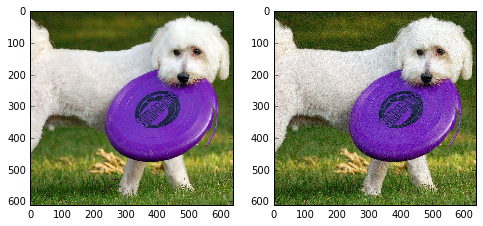

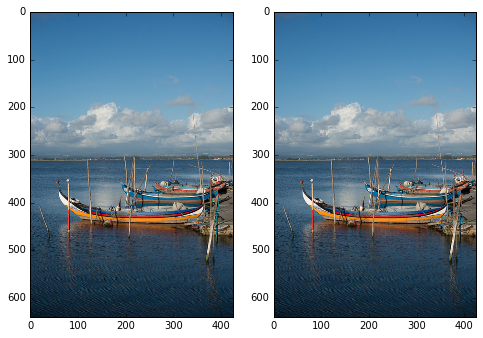

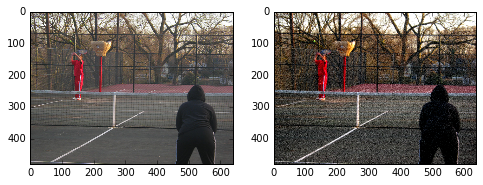

In [8]:
numTest=50
for ii in range(numTest):
    im=cv2.imread(train_imgs[ii]['filename'])
    imAug = aug_pipe.augment_image(im)
    plt.figure(figsize=(8,8))
    plt.subplot(1, 2, 1)
    plt.imshow(im[:,:,::-1])
    plt.subplot(1, 2, 2)
    plt.imshow(imAug[:,:,::-1])
    plt.show()
    